In [4]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


json >> yolo형식에 맞는 txt형식으로 변환

class id x y width height

In [ ]:
import json
import os
import glob

# JSON 파일들이 있는 디렉토리
json_dir = '/content/drive/MyDrive/Final_project/image_detect/Front_data/smartpad/val/json'  # JSON 파일들이 있는 디렉토리 경로
# YOLO 형식 라벨을 저장할 디렉토리
labels_dir = '/content/drive/MyDrive/Final_project/image_detect/Front_data/smartpad/val/labels'  # YOLO 라벨을 저장할 디렉토리 경로

# 클래스 이름을 클래스 ID로 매핑(부위)
class_name_to_id = {
    0: 0,  # 얼굴 전체
    1: 1,  # 이마
    2: 2,  # 미간
    3: 3,  # 왼쪽 눈가
    4: 4,  # 오른쪽 눈가
    5: 5,  # 왼쪽 볼
    6: 6,  # 오른쪽 볼
    7: 7,  # 입술
    8: 8,  # 턱
}

# YOLO 형식으로 변환 함수
def convert_to_yolo_format(image_width, image_height, bbox):
    if bbox is None or len(bbox) != 4:
        raise ValueError("Invalid bounding box format. Expected [x_min, y_min, width, height].")
    x_min, y_min, x_max, y_max = bbox

    # x_min = max(0, min(x_min, image_width))
    # y_min = max(0, min(y_min, image_height))
    # x_max = max(0, min(x_min + width, image_width))
    # y_max = max(0, min(y_min + height, image_height))

    #정규화 작업 >> 바운딩박스 크기를 0-1사이의 값으로 변환
    width = (x_max - x_min)
    height = (y_max - y_min)

    x_center = ((x_min + width / 2)) / image_width
    y_center = ((y_min + height / 2)) / image_height
    width /= image_width
    height /= image_height
    return x_center, y_center, width, height


# 각 각도에 대한 통합된 YOLO 파일 생성 (0 : 정면, 7 : 좌, 8 : 우)
angle_to_image_labels = {0: {}, 7: {}, 8: {}}

# JSON 파일들을 순회 (json >> txt)
for json_file_path in glob.glob(os.path.join(json_dir, '*.json')):
    # JSON 파일 읽기
    with open(json_file_path, 'r') as f:
        data = json.load(f)

    # 이미지 메타데이터 추출
    #json파일의 딕셔너리 형태에서 값 뽑음
    image_info = data['info']
    image_filename = image_info['filename']
    image_width = data['images']['width']
    image_height = data['images']['height']
    bbox = data['images'].get('bbox', None)  # bbox가 None일 수 있으므로 예외 처리
    angle = data['images']['angle']
    facepart = data['images']['facepart']

    # 클래스 ID 추출 facepart가 부위
    class_id = class_name_to_id.get(facepart, None)

    # 바운딩 박스를 YOLO 형식으로 변환
    # 바운딩 박스는 [x y width height]로 구성됨
    if class_id is not None and bbox is not None and angle in angle_to_image_labels:
        try:
            x_center, y_center, width, height = convert_to_yolo_format(image_width, image_height, bbox)
            yolo_label = f"{class_id} {x_center} {y_center} {width} {height}\n"

            # 각 각도에 대해 이미지 라벨 통합
            if image_filename not in angle_to_image_labels[angle]:
                angle_to_image_labels[angle][image_filename] = []
            angle_to_image_labels[angle][image_filename].append(yolo_label)
        except ValueError as e:
            print(f"Error processing file {json_file_path}: {e}")

# 각 각도에 대한 YOLO 라벨 파일 작성
for angle, images in angle_to_image_labels.items():
    for image_filename, labels in images.items():
        yolo_label_path = os.path.join(labels_dir, f"{os.path.splitext(image_filename)[0]}.txt")
        with open(yolo_label_path, 'w') as label_file:
            label_file.writelines(labels)

        print(f"Saved YOLO label to {yolo_label_path}")


Saved YOLO label to /content/drive/MyDrive/Final_project/image_detect/Front_data/smartpad/val/labels/0001_02_F.txt
Saved YOLO label to /content/drive/MyDrive/Final_project/image_detect/Front_data/smartpad/val/labels/0004_02_F.txt
Saved YOLO label to /content/drive/MyDrive/Final_project/image_detect/Front_data/smartpad/val/labels/0013_02_F.txt
Saved YOLO label to /content/drive/MyDrive/Final_project/image_detect/Front_data/smartpad/val/labels/0021_02_F.txt
Saved YOLO label to /content/drive/MyDrive/Final_project/image_detect/Front_data/smartpad/val/labels/0050_02_F.txt
Saved YOLO label to /content/drive/MyDrive/Final_project/image_detect/Front_data/smartpad/val/labels/0061_02_F.txt
Saved YOLO label to /content/drive/MyDrive/Final_project/image_detect/Front_data/smartpad/val/labels/0072_02_F.txt
Saved YOLO label to /content/drive/MyDrive/Final_project/image_detect/Front_data/smartpad/val/labels/0082_02_F.txt
Saved YOLO label to /content/drive/MyDrive/Final_project/image_detect/Front_data

In [ ]:
# %cd /content/drive/MyDrive/최종프로젝트/이미지 처리
# !git clone https://github.com/ultralytics/yolov5

/content/drive/MyDrive/최종프로젝트/이미지 처리
Cloning into 'yolov5'...
remote: Enumerating objects: 16836, done.
remote: Counting objects: 100% (11/11), done.
remote: Compressing objects: 100% (11/11), done.
remote: Total 16836 (delta 1), reused 6 (delta 0), pack-reused 16825
Receiving objects: 100% (16836/16836), 15.57 MiB | 14.83 MiB/s, done.
Resolving deltas: 100% (11541/11541), done.


In [ ]:
# %cd /content/drive/MyDrive/최종프로젝트/이미지 처리/yolov5
# !pip install -r requirements.txt

/content/drive/MyDrive/최종프로젝트/이미지 처리/yolov5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.3/41.3 kB 2.6 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cach

In [ ]:
%cat /content/drive/MyDrive/Final_project/image_detect/dataset/data.yaml

train: /content/drive/MyDrive/Final_project/image_detect/dataset/train/images 
val: /content/drive/MyDrive/Final_project/image_detect/dataset/val/images    

nc: 9  
names: ['whole_face', 'forehead', 'glabellus', 'l_perocular', 'r_perocular', 
        'l_cheek', 'r_cheek', 'lip', 'chin']

모델 학습

https://github.com/ultralytics/yolov5/wiki/Train-Custom-Data

img 416 : 이미지 크기 (416x416)
batch 16 : 배치크기 >> 묶어서 학습
epochs 50 : 학습 횟수

In [ ]:
%cd /content/drive/MyDrive/Final_project/image_detect/yolov5
!python train.py --img 416 --batch 16 --epochs 50 --data /content/drive/MyDrive/Final_project/image_detect/dataset/data.yaml --cfg ./models/yolov5s.yaml --weights yolov5s.pt --name team2_yolov5s_results

/content/drive/MyDrive/Final_project/image_detect/yolov5
2024-08-07 02:28:57.752436: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-08-07 02:28:57.773784: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-08-07 02:28:57.780340: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=./models/yolov5s.yaml, data=/content/drive/MyDrive/Final_project/image_detect/dataset/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=50, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve

In [ ]:
%load_ext tensorboard
%tensorboard --logdir /content/drive/MyDrive/Final_project/image_detect/yolov5/runs/

Output hidden; open in https://colab.research.google.com to view.

모델 평가

In [ ]:
!python detect.py --source ./path_to/image.png --weights ./runs/train/exp/weights.best.pt

데이터 추가 학습

In [ ]:
!python train.py --img 800 --batch 16 --epochs 10 --data custom_dataset.yaml --weights path_to/best.pt

In [ ]:
# import cv2
# import torch
# import matplotlib.pyplot as plt

# # YOLOv5 모델 로드 (학습된 가중치 사용)
# model = torch.hub.load('ultralytics/yolov5', 'custom', path='/content/drive/MyDrive/Final_project/image_detect/yolov5/runs/train/team2_yolov5s_results/weights/best.pt')

# # 이미지 경로 설정
# image_path = '/content/drive/MyDrive/Final_project/image_detect/dataset/myface.jpg'  # 테스트할 이미지 파일 경로

# # 이미지 로드 (OpenCV 사용)
# image = cv2.imread(image_path)
# if image is None:
#     raise ValueError(f"Image not found or unable to open: {image_path}")

# # 이미지 크기 조정
# new_width, new_height = 480, 600
# resized_image = cv2.resize(image, (new_width, new_height))

# # BGR 이미지를 RGB로 변환
# image_rgb = cv2.cvtColor(resized_image, cv2.COLOR_BGR2RGB)

# # 이미지 탐지
# results = model(image_rgb)

# # 결과 시각화
# results.print()  # 탐지 결과 출력
# results.show()   # 탐지된 이미지 시각화

# # 결과 이미지 저장
# output_path = '/content/drive/MyDrive/Final_project/image_detect/dataset/save_image/label_image.jpg'
# cv2.imwrite(output_path, image_rgb)

# # 이미지 출력 (matplotlib 사용)
# plt.imshow(image_rgb)
# plt.axis('off')
# plt.show()



Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-8-7 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (NVIDIA L4, 22700MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7034398 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 
image 1/1: 600x480 1 forehead, 1 glabellus, 2 l_cheeks, 2 r_cheeks, 1 lip, 2 chins
Speed: 2.4ms pre-process, 8.9ms inference, 1.7ms NMS per image at shape (1, 3, 640, 512)


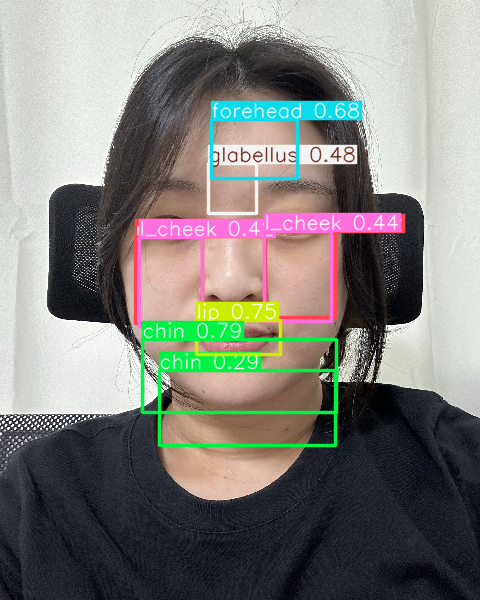

In [ ]:
import cv2
import torch
import matplotlib.pyplot as plt
import numpy as np

# YOLOv5 모델 로드 (학습된 가중치 사용)
model = torch.hub.load('ultralytics/yolov5', 'custom', path='/content/drive/MyDrive/Final_project/image_detect/yolov5/runs/train/team2_yolov5s_results/weights/best.pt')

# 이미지 경로 설정
image_path = '/content/drive/MyDrive/Final_project/image_detect/dataset/myface.jpg'  # 테스트할 이미지 파일 경로

# 이미지 로드 (OpenCV 사용)
image = cv2.imread(image_path)
if image is None:
    raise ValueError(f"Image not found or unable to open: {image_path}")

# 이미지 크기 조정
new_width, new_height = 480, 600
resized_image = cv2.resize(image, (new_width, new_height))

# BGR 이미지를 RGB로 변환
image_rgb = cv2.cvtColor(resized_image, cv2.COLOR_BGR2RGB)

# 이미지 탐지
results = model(image_rgb)

# 결과 시각화
results.print()  # 탐지 결과 출력
results.show()   # 탐지된 이미지 시각화

# 바운딩 박스와 클래스 ID 추출 및 저장
detection_data = results.xyxy[0].cpu().numpy()  # xyxy 포맷의 결과를 numpy 배열로 변환
output_txt_path = '/content/drive/MyDrive/Final_project/image_detect/dataset/save_bbox/label_image.txt'

with open(output_txt_path, 'w') as f:
    for *box, conf, cls in detection_data:
        x1, y1, x2, y2 = map(int, box)  # 바운딩 박스 좌표를 정수로 변환
        class_id = int(cls)
        f.write(f"{class_id} {x1} {y1} {x2} {y2}\n")

# 결과 이미지 저장
output_image_path = '/content/drive/MyDrive/Final_project/image_detect/dataset/save_image/label_image.jpg'
cv2.imwrite(output_image_path, cv2.cvtColor(image_rgb, cv2.COLOR_RGB2BGR))

# 이미지 출력 (matplotlib 사용)
plt.imshow(image_rgb)
plt.axis('off')
plt.show()


In [5]:
import os

label_dir = '/content/drive/MyDrive/Final_project/image_detect/Front_data/smartpad/train/labels'

# 레이블 파일들 확인
for label_file in os.listdir(label_dir):
    with open(os.path.join(label_dir, label_file), 'r') as file:
        for line in file:
            values = line.strip().split()
            if len(values) != 5:
                print(f"Error in file {label_file}: {line}")

1이 넘어가는 값이 있는지 확인

In [ ]:
import os

label_dir = '/content/drive/MyDrive/Final_project/image_detect/dataset/val/labels'

for label_file in os.listdir(label_dir):
    with open(os.path.join(label_dir, label_file), 'r') as file:
        for line in file:
            values = line.strip().split()
            class_id, x_center, y_center, width, height = map(float, values)
            if not (0 <= x_center <= 1 and 0 <= y_center <= 1 and
                    0 <= width <= 1 and 0 <= height <= 1):
                print(f"Out of bounds in file {label_file}: {line}")


In [18]:
import os

def check_class_id_in_folder(folder_path, class_id=4):
    files_without_class_id = []
    files_with_class_id = []

    for file_name in os.listdir(folder_path):
        if file_name.endswith('.txt'):
            file_path = os.path.join(folder_path, file_name)
            with open(file_path, 'r') as file:
                content = file.readlines()
                contains_class_id = any(line.startswith(f"{class_id} ") for line in content)

                if contains_class_id:
                    files_with_class_id.append(file_name)
                else:
                    files_without_class_id.append(file_name)

    if files_with_class_id:
        print(f"Files containing class ID {class_id}:")
        for file_name in files_with_class_id:
            print(file_name)
    else:
        print(f"No files contain class ID {class_id}.")

    if files_without_class_id:
        print(f"\nFiles without class ID {class_id}:")
        for file_name in files_without_class_id:
            print(file_name)
    else:
        print(f"\nAll files contain class ID {class_id}.")

# 예시 폴더 경로
folder_path = '/content/drive/MyDrive/Final_project/image_detect/Front_data/smartpad/val/labels'

# 클래스 ID 4번이 있는지 확인
check_class_id_in_folder(folder_path, class_id=2)


Files containing class ID 2:
0001_02_F.txt
0004_02_F.txt
0013_02_F.txt
0021_02_F.txt
0050_02_F.txt
0061_02_F.txt
0072_02_F.txt
0082_02_F.txt
0090_02_F.txt
0111_02_F.txt
0115_02_F.txt
0117_02_F.txt
0120_02_F.txt
0144_02_F.txt
0149_02_F.txt
0159_02_F.txt
0168_02_F.txt
0186_02_F.txt
0207_02_F.txt
0249_02_F.txt
0250_02_F.txt
0257_02_F.txt
0262_02_F.txt
0275_02_F.txt
0277_02_F.txt
0307_02_F.txt
0312_02_F.txt
0321_02_F.txt
0338_02_F.txt
0356_02_F.txt
0378_02_F.txt
0379_02_F.txt
0390_02_F.txt
0398_02_F.txt
0402_02_F.txt
0415_02_F.txt
0418_02_F.txt
0444_02_F.txt
0450_02_F.txt
0458_02_F.txt
0484_02_F.txt
0494_02_F.txt
0514_02_F.txt
0517_02_F.txt
0522_02_F.txt
0528_02_F.txt
0529_02_F.txt
0536_02_F.txt
0538_02_F.txt
0560_02_F.txt
0566_02_F.txt
0568_02_F.txt
0569_02_F.txt
0583_02_F.txt
0591_02_F.txt
0614_02_F.txt
0615_02_F.txt
0627_02_F.txt
0630_02_F.txt
0657_02_F.txt
0659_02_F.txt
0671_02_F.txt
0673_02_F.txt
0675_02_F.txt
0715_02_F.txt
0753_02_F.txt
0755_02_F.txt
0756_02_F.txt
0766_02_F.txt
0779_